In [129]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [130]:
import os, sys
import numpy as np
import pandas as pd
import torch
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
from sklearn.model_selection import KFold

import os
import sys
sys.path.insert(0, os.path.join("../.."))

from src.models import VisionAuxNet
from src.data import build_transforms
from src.gradcam import (
    GradCAMSwin, cam_to_heatmap,
    compute_cam_mask_overlap,
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


In [131]:
MAIN_FOLDER = os.path.join("../..")
IMG_FOLDER  = os.path.join(MAIN_FOLDER, "data", "train")

# exp19:  model with main head + 4 aux heads
MODEL_DIR = os.path.join(
    MAIN_FOLDER, "outputs", "extra",
    "exp19_swin_384_strong_MSELoss_Multiple_Aux_StrongHead",
)

BACKBONE  = "swin_large_patch4_window12_384"
IMG_SIZE  = 384
SWIN_GRID = (12, 12)
FOLDS     = 5


AUX_TASKS = ["Eyes", "Face", "Occlusion", "Blur"]


THRESHOLDS = {
    "Eyes":      0.5,    # prob < threshold -> eyes not visible -> warn
    "Face":      0.5,    # prob < threshold -> face not visible -> warn
    "Occlusion": 0.5,   # prob > threshold -> pet occluded     -> warn
    "Blur":      0.5,    # prob > threshold -> image blurry     -> warn
}
df = pd.read_csv(os.path.join(MAIN_FOLDER, "data", "train.csv"))

In [156]:
import os
import pandas as pd
from sklearn.metrics import root_mean_squared_error

out_dir = os.path.join(
    MAIN_FOLDER, "outputs", "extra",
    "exp19_swin_384_strong_MSELoss_Multiple_Aux_StrongHead"
)
exp_name_weightedBCE = "exp18_swin_384_strong_MSELoss_MultipleAuxHead_AuxBCEWeightedLoss_StrongHead"
out_dir_weightedBCE = os.path.join(MAIN_FOLDER, "outputs", "extra", "exp18_aux_heads_metadata_weightedBCELoss",exp_name_weightedBCE)
df_log = pd.read_csv(os.path.join(out_dir, "epoch_logs_fold1.csv"))
df_log_weightedBCE = pd.read_csv(os.path.join(out_dir_weightedBCE, "epoch_logs_fold1.csv"))
heads = ["Eyes", "Face", "Occlusion", "Blur"]

def print_aux_task_performance_summary(df_log, heads, title="Aux Task Performance Summary"):
    print("=" * 50)
    print(title)
    print("=" * 50)
    for head in heads:
        f1_col   = f"{head}_val_f1"
        acc_col  = f"{head}_val_acc"
        prec_col = f"{head}_val_prec"
        rec_col  = f"{head}_val_rec"
        if f1_col in df_log.columns:
            best_idx = df_log[f1_col].idxmax()
            print(
                f"{head:12s} | "
                f"F1={df_log.loc[best_idx, f1_col]:.4f} | "
                f"Acc={df_log.loc[best_idx, acc_col]:.4f} | "
                f"Prec={df_log.loc[best_idx, prec_col]:.4f} | "
                f"Rec={df_log.loc[best_idx, rec_col]:.4f} "
                
            )
        else:
            print(f"{head:12s} | not found in log")
print_aux_task_performance_summary(df_log, heads, "Aux Task Performance Summary - Standard BCE Loss")
print_aux_task_performance_summary(df_log_weightedBCE, heads, "Aux Task Performance Summary - Weighted BCE Loss")  

#overall RMSE


def load_oof_rmse(exp_dir):
    path = os.path.join(exp_dir, "metrics.txt")
    if os.path.exists(path):
        with open(path) as f:
            for line in f:
                if "OOF_RMSE" in line:
                    return float(line.strip().split(":")[1])
    oof_path = os.path.join(exp_dir, "oof_detail.csv")
    if os.path.exists(oof_path):
        oof = pd.read_csv(oof_path)
        return float(root_mean_squared_error(oof["ytrue"], oof["oof_pred"]))
    return None
#  OOF RMSE ─
rmse_bce  = load_oof_rmse(out_dir)
rmse_wbce = load_oof_rmse(out_dir_weightedBCE)
print("=" * 50)
print("OOF RMSE")
print("=" * 50)
print(f"  Standard Aux Task BCE Loss and Main Head RMSE : {rmse_bce:.4f}"  if rmse_bce  else "  Standard Aux Task BCE : not found")
print(f"  Weighted Aux Task BCE Loss and Main Head RMSE : {rmse_wbce:.4f}" if rmse_wbce else "  Weighted Aux Task BCE : not found")

Aux Task Performance Summary - Standard BCE Loss
Eyes         | F1=0.8829 | Acc=0.7927 | Prec=0.7912 | Rec=0.9987 
Face         | F1=0.9541 | Acc=0.9123 | Prec=0.9123 | Rec=1.0000 
Occlusion    | F1=0.0120 | Acc=0.8341 | Prec=1.0000 | Rec=0.0060 
Blur         | F1=0.0000 | Acc=0.9410 | Prec=0.0000 | Rec=0.0000 
Aux Task Performance Summary - Weighted BCE Loss
Eyes         | F1=0.5165 | Acc=0.7640 | Prec=0.4655 | Rec=0.5800 
Face         | F1=0.4289 | Acc=0.8764 | Prec=0.3608 | Rec=0.5287 
Occlusion    | F1=0.5451 | Acc=0.7811 | Prec=0.4173 | Rec=0.7855 
Blur         | F1=0.1864 | Acc=0.8855 | Prec=0.1605 | Rec=0.2222 
OOF RMSE
  Standard Aux Task BCE Loss and Main Head RMSE : 17.7561
  Weighted Aux Task BCE Loss and Main Head RMSE : 17.7846


### Standard Aux Task overll RMSE is better , so we will take that model

In [153]:
def load_model(fold, device):
    """
    Load  model.
    """
    ckpt = os.path.join(MODEL_DIR, f"model_fold{fold}.pt")
    if not os.path.exists(ckpt):
        raise FileNotFoundError(f"Checkpoint not found: {ckpt}")

    model = VisionAuxNet(
        backbone_name=BACKBONE,
        img_size=IMG_SIZE,
        aux_tasks=[],
        binary_aux_tasks=AUX_TASKS,
        head_type="mlp",
        pretrained=False,
        use_saliency=False,
    ).to(device)

    model.load_state_dict(
        torch.load(ckpt, map_location=device), strict=True
    )
    model.eval()
    return model


allFolds_models = []
for fold in range(1, FOLDS + 1):
    try:
        allFolds_models.append(load_model(fold, device))
        print(f"  fold {fold} loaded")
    except FileNotFoundError as e:
        print(f"  fold {fold} skipped: {e}")


print(f"Aux heads: {AUX_TASKS}")

  fold 1 loaded
  fold 2 loaded
  fold 3 loaded
  fold 4 loaded
  fold 5 loaded
Aux heads: ['Eyes', 'Face', 'Occlusion', 'Blur']


In [133]:
def preprocess(image_path):
    """Returns (tensor (1,3,H,W), PIL Image)."""
    tf      = build_transforms(IMG_SIZE, aug_type="strong", train=False)
    img_pil = Image.open(image_path).convert("RGB")
    tensor  = tf(img_pil).unsqueeze(0)
    return tensor, img_pil

In [134]:
def predict_pawpularity(img_tensor, fold=0):
    """
    Predict Pawpularity using a single fold model.
    Returns float in [0, 100].
    """
    x = img_tensor.to(device)
    model = allFolds_models[fold]  #  fold index (0 = fold 1)
    with torch.no_grad():
        out = model(x)
        pred = float(out["main"].squeeze().cpu().item())
    return float(max(0.0, min(100.0, pred)))


def predict_aux(img_tensor):
    """
    Predict auxiliary labels using fold 1 model.
    Returns dict {task: probability in [0,1]}.

    Interpretation (standard BCE, no flipping):
      Eyes:      high prob -> eyes visible,    low prob -> eyes NOT visible
      Face:      high prob -> face visible,    low prob -> face NOT visible
      Occlusion: high prob -> pet occluded,    low prob -> pet NOT occluded
      Blur:      high prob -> image blurry,    low prob -> image NOT blurry
    """
    probs = {}
    x     = img_tensor.to(device)
    model = allFolds_models[0]
    with torch.no_grad():
        out = model(x)
        for task in AUX_TASKS:
            if task in out:
                prob = float(
                    torch.sigmoid(out[task]).squeeze().cpu().item()
                )
                probs[task] = prob
    return probs

In [135]:
def get_gradcam(img_tensor, img_pil):
    """
    GradCAM w.r.t. main Pawpularity head.
    Uses fold 1 of same  model.
    Returns (cam array, cam_rsz uint8, overlay PIL Image).
    """
    model        = allFolds_models[0]
    target_layer = model.backbone.layers[-1].blocks[-1].norm1
    cam_obj      = GradCAMSwin(
        model, target_layer, device, grid_size=SWIN_GRID
    )
    cam = cam_obj(img_tensor.to(device), target_head="main")
    overlay, cam_rsz = cam_to_heatmap(cam, img_pil, alpha=0.5)
    cam_obj.remove_hooks()
    return cam, cam_rsz, overlay

In [136]:
def detect_pet_bbox(image_path):
    """
    YOLOv8n pet detection (cat=15, dog=16).
    Returns (x1, y1, x2, y2) or None.
    """
    try:
        from ultralytics import YOLO
        yolo    = YOLO("yolov8n.pt")
        results = yolo(image_path, verbose=False, classes=[15, 16], conf=0.01)
        if (results and
                results[0].boxes is not None and
                len(results[0].boxes) > 0):
            boxes    = results[0].boxes
            best_idx = int(boxes.conf.argmax())
            x1, y1, x2, y2 = boxes.xyxy[best_idx].cpu().numpy()
            return float(x1), float(y1), float(x2), float(y2)
    except Exception as e:
        print(f"  YOLO skipped: {e}")
    return None


def get_cam_overlap(cam_rsz, bbox, img_pil):
    W, H = img_pil.size
    return compute_cam_mask_overlap(cam_rsz, bbox, W, H)

In [167]:
def generate_feedback(paw_score, aux_probs, cam_pet_overlap=None,true_paw=None, true_aux=None    ):
    """
    Generate feedback from  model outputs.

    Logic (standard BCE, original label meanings):
      Blur      prob > 0.50 -> blurry warning
      Face      prob < 0.50 -> face not visible warning
      Eyes      prob < 0.50 -> eyes not visible warning
      Occlusion prob > 0.50 -> occlusion warning
    """
    lines = []
    if true_aux is None:         
        true_aux = {} 

    if true_paw is not None:
        lines.append(f"True Pawpularity: {true_paw:.0f}")
    #true labels
    true_bits = []
    if "Eyes" in true_aux:
        true_bits.append(f"Eyes={true_aux['Eyes']}")
    if "Face" in true_aux:
        true_bits.append(f"Face={true_aux['Face']}")
    if "Occlusion" in true_aux:
        true_bits.append(f"Occlusion={true_aux['Occlusion']}")
    if "Blur" in true_aux:
        true_bits.append(f"Blur={true_aux['Blur']}")

    if true_bits:
        lines.append("True labels: " + ", ".join(true_bits))
    # predicted aux probs
    pred_bits = []
    if aux_probs.get("Eyes") is not None:
        pred_bits.append(f"Eyes prob={aux_probs['Eyes']:.3f}")
    if aux_probs.get("Face") is not None:
        pred_bits.append(f"Face prob={aux_probs['Face']:.3f}")
    if aux_probs.get("Occlusion") is not None:
        pred_bits.append(f"Occlusion prob={aux_probs['Occlusion']:.3f}")
    if aux_probs.get("Blur") is not None:
        pred_bits.append(f"Blur prob={aux_probs['Blur']:.3f}")

    if pred_bits:
        lines.append("Pred aux: " + ", ".join(pred_bits))    
    # score context
    if paw_score < 30:
        lines.append(
            f"Predicted Pawpularity: {paw_score:.1f}\n"
            "Limited engagement potential based on visual features."
        )
    elif paw_score < 60:
        lines.append(
            f"Predicted Pawpularity: {paw_score:.1f}\n"
            "Moderate engagement potential detected."
        )
    else:
        lines.append(
            f"Predicted Pawpularity: {paw_score:.1f}\n"
            "Good engagement potential detected."
        )

    flags = []

    # Blur=1 means blurry -> high prob = blurry
    blur_prob = aux_probs.get("Blur")
    if blur_prob is not None and blur_prob > THRESHOLDS["Blur"]:
        flags.append(
            f"Image may appear blur"
            f"({blur_prob:.0%} confidence).\n"
            "   The image is blur and a sharper image may improve visual clarity."
        )

    # Face=1 means face visible -> low prob = face NOT visible
    face_prob = aux_probs.get("Face")
    if face_prob is not None and face_prob < THRESHOLDS["Face"]:
        flags.append(
            f"Pet face may not be clearly visible "
            f"({1 - face_prob:.0%} confidence).\n"
            "   A photo showing the face clearly may help."
        )

    # Eyes=1 means eyes visible -> low prob = eyes NOT visible
    eyes_prob = aux_probs.get("Eyes")
    if eyes_prob is not None and eyes_prob < THRESHOLDS["Eyes"]:
        flags.append(
            f"Pet eyes may not be clearly visible "
            f"({1 - eyes_prob:.0%} confidence).\n"
            "   Ensuring visible eyes can improve appeal."
        )

    # Occlusion=1 means occluded -> high prob = occluded
    occ_prob = aux_probs.get("Occlusion")
    if occ_prob is not None and occ_prob > THRESHOLDS["Occlusion"]:
        flags.append(
            f"Pet may be partially occluded "
            f"({occ_prob:.0%} confidence).\n"
            "   A photo with the full pet visible may perform better."
        )

    if flags:
        lines.extend(flags)
    else:
        lines.append(
            "No major visual issues detected\n"
            "   (image is not blurry, face/eyes visible, "
            "pet not occluded)."
        )

    # attention note
    if cam_pet_overlap is not None:
        if cam_pet_overlap < 0.10:
            lines.append(
                "Model attention is broadly distributed across "
                "the scene.\n"
                "   Background, lighting, and composition also "
                "influence the score."
            )
        else:
            lines.append(
                f"Model attending moderately to pet region "
                f"(overlap: {cam_pet_overlap:.2f})."
            )

    lines.append(
        "Note: Pawpularity reflects platform engagement and may\n"
        "be influenced by non-visual factors. These suggestions\n"
        "are explanatory, "
    )
    return lines

In [168]:
def visualise(img_pil, cam_overlay, feedback_lines,
              img_id="", true_paw=None, save_path=None):
    """
    3-panel figure: Original | GradCAM | Feedback.
    All panels from same  model.
    """
    fig = plt.figure(figsize=(16, 5))
    gs  = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1.5])

    title1 = f"Input Image: {img_id}"
    if true_paw is not None:
        title1 += f"\nTrue Pawpularity: {true_paw:.0f}"

    ax1 = fig.add_subplot(gs[0])
    ax1.imshow(img_pil)
    ax1.set_title(title1, fontsize=11, fontweight="bold")
    ax1.axis("off")

    ax2 = fig.add_subplot(gs[1])
    ax2.imshow(cam_overlay)
    ax2.set_title(
        "Model Attention (GradCAM)\nw.r.t. Pawpularity head",
        fontsize=11, fontweight="bold"
    )
    ax2.axis("off")

    ax3 = fig.add_subplot(gs[2])
    ax3.axis("off")
    ax3.set_title(
        "Semantic Feedback\n(from aux heads of same model)",
        fontsize=11, fontweight="bold"
    )
    text = "\n\n".join(feedback_lines)
    ax3.text(
        0.02, 0.97, text,
        transform=ax3.transAxes,
        fontsize=9,
        verticalalignment="top",
        wrap=True,
        bbox=dict(
            boxstyle="round,pad=0.4",
            facecolor="#f5f5f5",
            alpha=0.8
        ),
    )

    plt.tight_layout()
    plt.show()
    plt.close(fig)

In [169]:
def run_batch(image_ids, true_paw_dict=None,true_aux_dict=None,
              save_dir=None, use_yolo=True):
    """
    Run  inference on multiple images.
    true_paw_dict: optional {img_id: true_score} for display.
    """
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
    if true_paw_dict is None:
        true_paw_dict = {}
    if true_aux_dict is None:
        true_aux_dict = {}
    
    rows = []
    for img_id in image_ids:
        path = os.path.join(IMG_FOLDER, img_id + ".jpg")
        if not os.path.exists(path):
            print(f"  Skipping {img_id} — not found")
            continue

        print(f"\nProcessing: {img_id}")
        img_tensor, img_pil= preprocess(path)
        paw_score = predict_pawpularity(img_tensor, fold=0)  # fold index (0 = fold 1)
        aux_probs  = predict_aux(img_tensor)
        cam, cam_rsz, cam_ov = get_gradcam(img_tensor, img_pil)

        overlap = 0
        if use_yolo:
            bbox = detect_pet_bbox(path)
            if bbox is not None:
                # overlap = get_cam_overlap(cam_rsz, bbox, img_pil)
                overlap_val = get_cam_overlap(cam_rsz, bbox, img_pil)   
                if overlap_val is not None:                             
                    overlap = float(overlap_val)  

        true_aux = true_aux_dict.get(img_id, {})
        true_paw = true_paw_dict.get(img_id, None)
        feedback = generate_feedback(paw_score, aux_probs, overlap,true_paw=true_paw, true_aux=true_aux)
        
        


        if save_dir:
            fig_path = os.path.join(save_dir, f"{img_id}_feedback.png")
            visualise(img_pil, cam_ov, feedback,
                      img_id=img_id, true_paw=true_paw,
                      save_path=fig_path)

        rows.append({
            "Id":              img_id,
            "true_paw":        true_paw,
            "pred_paw":       round(paw_score, 2),
            "true_eyes":       true_aux.get("Eyes", None),       
            "true_face":       true_aux.get("Face", None),        
            "true_occlusion":  true_aux.get("Occlusion", None),   
            "true_blur":       true_aux.get("Blur", None),        

            "eyes_prob":       round(aux_probs.get("Eyes",      -1), 3),
            "face_prob":       round(aux_probs.get("Face",      -1), 3),
            "occlusion_prob":  round(aux_probs.get("Occlusion", -1), 3),
            "blur_prob":       round(aux_probs.get("Blur",      -1), 3),
            "cam_pet_overlap": round(overlap, 3),
            # flag meanings: 1 = warning fired
            "eyes_flag":       int(aux_probs.get("Eyes",  1) < THRESHOLDS["Eyes"]),
            "face_flag":       int(aux_probs.get("Face",  1) < THRESHOLDS["Face"]),
            "occ_flag":        int(aux_probs.get("Occlusion", 0) > THRESHOLDS["Occlusion"]),
            "blur_flag":       int(aux_probs.get("Blur",  0) > THRESHOLDS["Blur"]),
        })

    result_df = pd.DataFrame(rows)
    return result_df

High Paw IDs: ['00768659c1c90409f81dcdecbd270513', '013f86ed0e765b189990d3d5ac28bd7d', '12b136b947a64c8b23e3929f70b41933', '17a155499581a5209a0bb6bb351b8ece', '1c9218a5f9e21e9b60e118be4da3cf84']
Low  Paw IDs: ['e0a1efdaf4fbed8659b6d23994ee346e', '0f084229a71c6a6b744a569c25de6957', '4e3c8816d95b083b870c6747a26fcb58', '629dce5e656b5155c2ef9adad225f77c', '6b27aef2933b9e6ad8ceb07de4fa891c']
Mid  Paw IDs: ['01677db1a9bd1e37386a49cc1d6545a2', '02eaa2451e7022bc23156b68ecced4a2', '11a75cfcf53ea42140cff8e30fa81d40', '13d4f91603b8349d577b4965e93a59f6', '1714842f0c58efb2969e50a3beab5b7e']

Processing: 00768659c1c90409f81dcdecbd270513


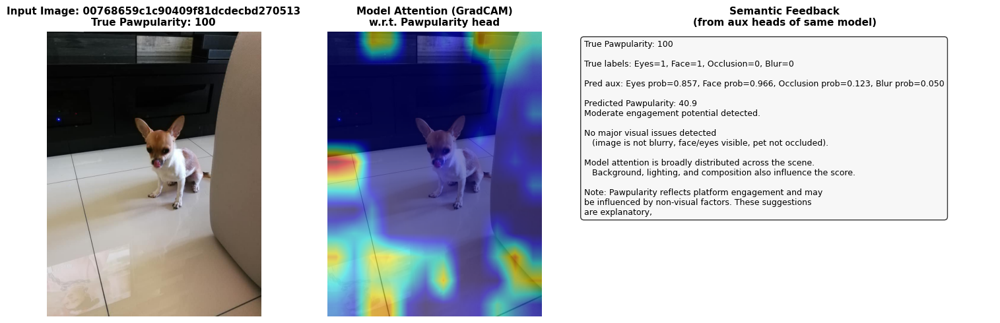


Processing: 013f86ed0e765b189990d3d5ac28bd7d


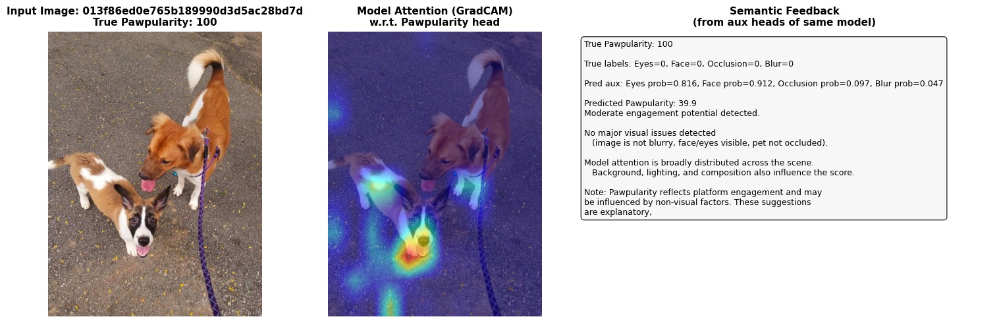


Processing: 12b136b947a64c8b23e3929f70b41933


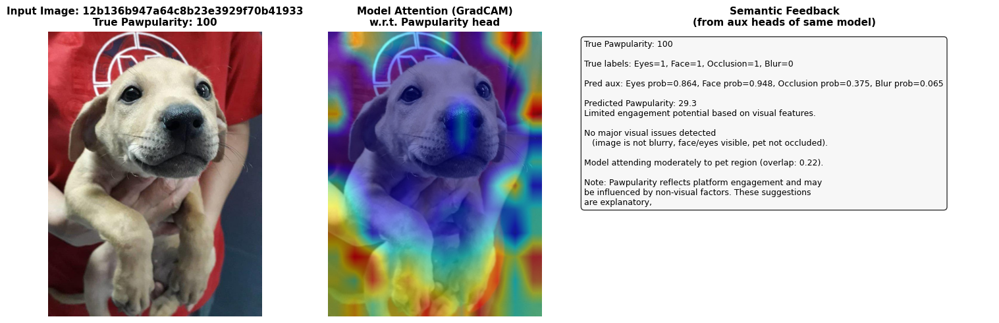


Processing: 17a155499581a5209a0bb6bb351b8ece


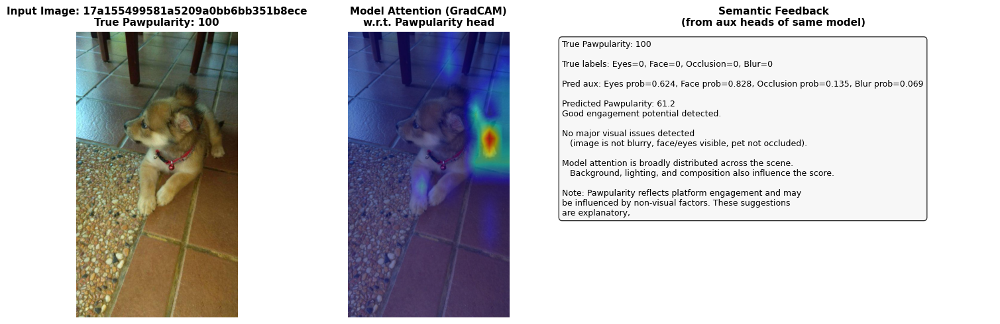


Processing: 1c9218a5f9e21e9b60e118be4da3cf84


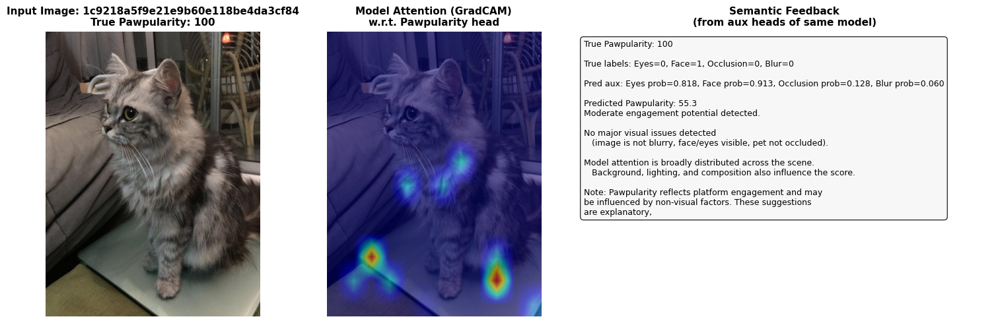


Processing: e0a1efdaf4fbed8659b6d23994ee346e


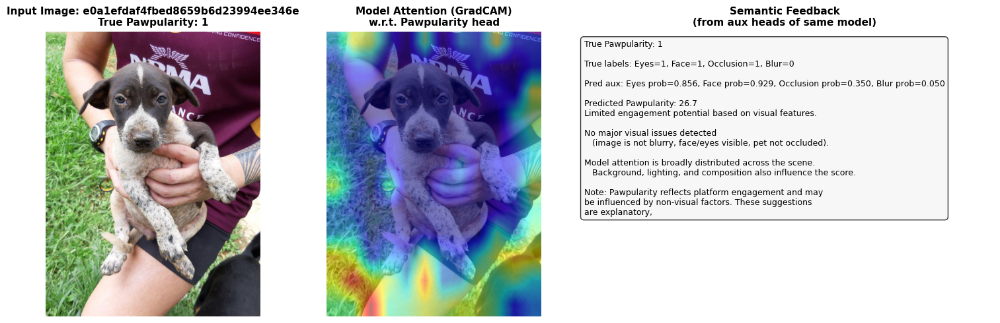


Processing: 0f084229a71c6a6b744a569c25de6957


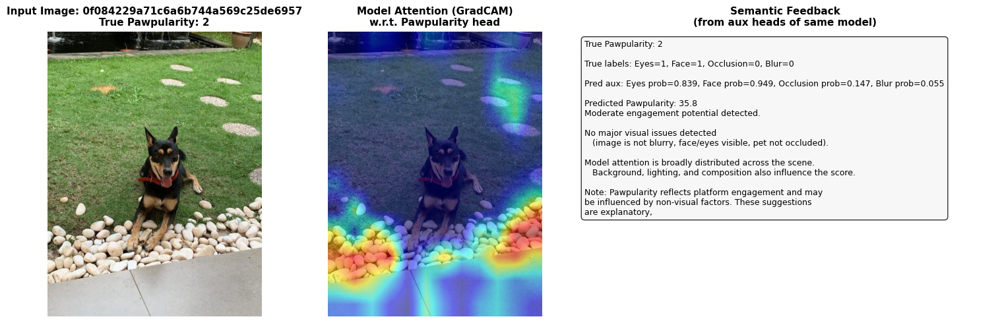


Processing: 4e3c8816d95b083b870c6747a26fcb58


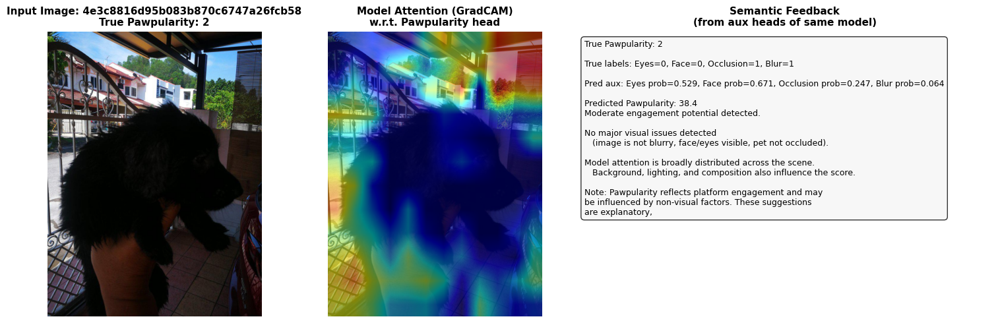


Processing: 629dce5e656b5155c2ef9adad225f77c


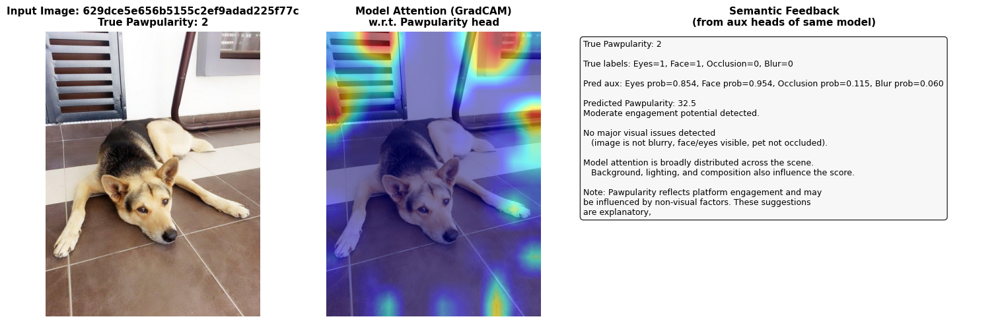


Processing: 6b27aef2933b9e6ad8ceb07de4fa891c


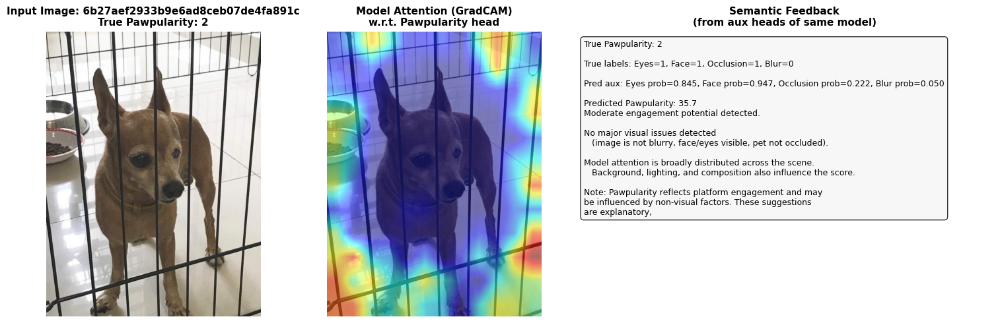


Processing: 01677db1a9bd1e37386a49cc1d6545a2


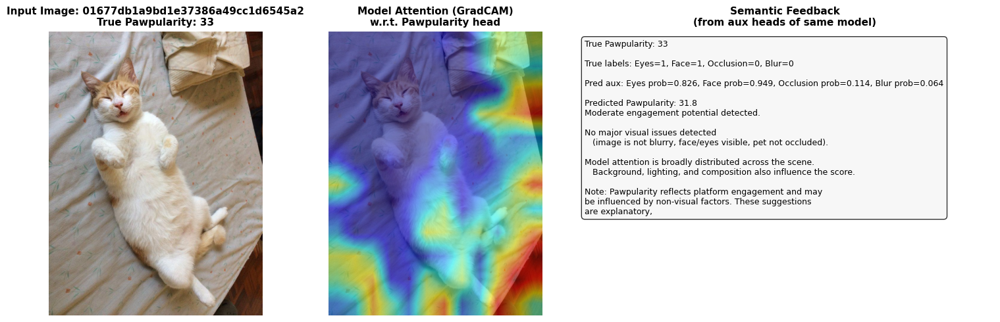


Processing: 02eaa2451e7022bc23156b68ecced4a2


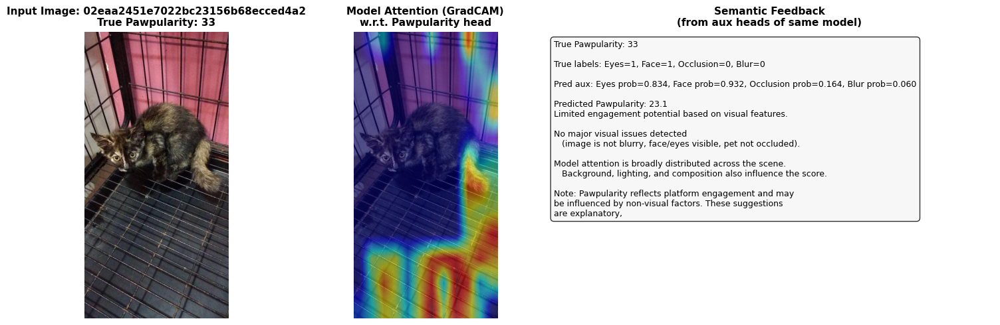


Processing: 11a75cfcf53ea42140cff8e30fa81d40


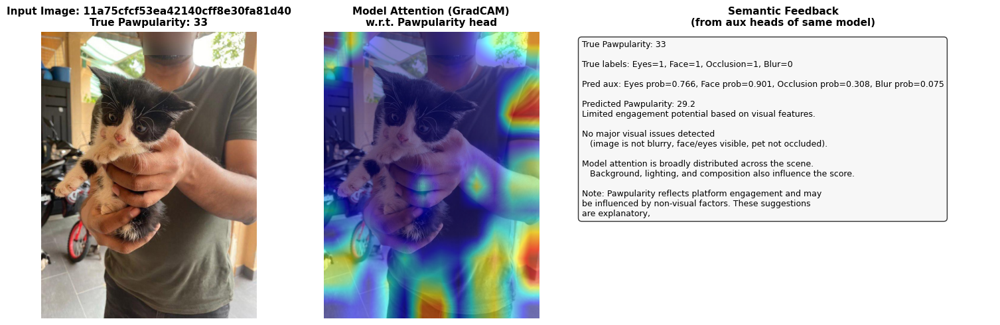


Processing: 13d4f91603b8349d577b4965e93a59f6


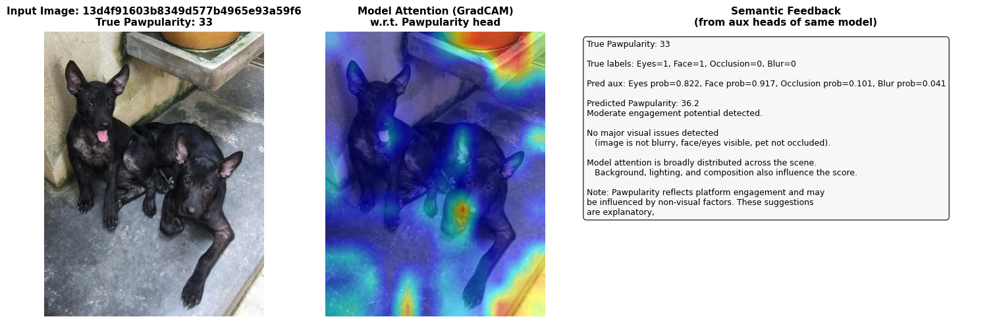


Processing: 1714842f0c58efb2969e50a3beab5b7e


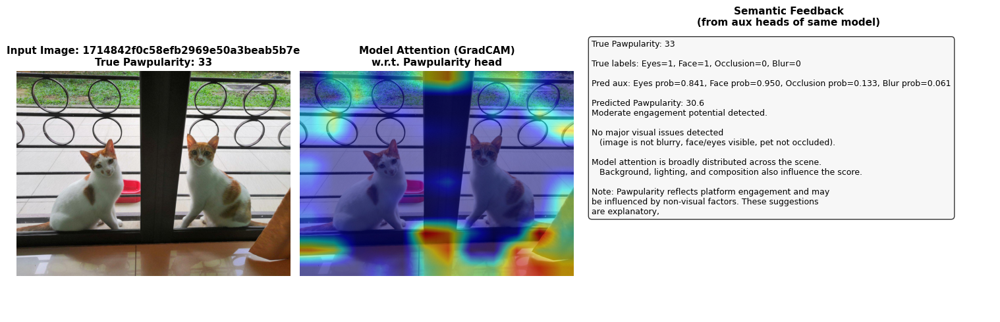

,Id,true_paw,pred_paw,true_eyes,true_face,true_occlusion,true_blur,eyes_prob,face_prob,occlusion_prob,blur_prob,cam_pet_overlap,eyes_flag,face_flag,occ_flag,blur_flag
0,00768659c1c90409f81dcdecbd270513,100,40.93,1,1,0,0,0.857,0.966,0.123,0.050,0.000,0,0,0,0
1,013f86ed0e765b189990d3d5ac28bd7d,100,39.88,0,0,0,0,0.816,0.912,0.097,0.047,0.000,0,0,0,0
2,12b136b947a64c8b23e3929f70b41933,100,29.32,1,1,1,0,0.864,0.948,0.375,0.065,0.215,0,0,0,0
3,17a155499581a5209a0bb6bb351b8ece,100,61.20,0,0,0,0,0.624,0.828,0.135,0.069,0.032,0,0,0,0
4,1c9218a5f9e21e9b60e118be4da3cf84,100,55.26,0,1,0,0,0.818,0.913,0.128,0.060,0.009,0,0,0,0
5,e0a1efdaf4fbed8659b6d23994ee346e,1,26.67,1,1,1,0,0.856,0.929,0.350,0.050,0.035,0,0,0,0
6,0f084229a71c6a6b744a569c25de6957,2,35.80,1,1,0,0,0.839,0.949,0.147,0.055,0.002,0,0,0,0
7,4e3c8816d95b083b870c6747a26fcb58,2,38.38,0,0,1,1,0.529,0.671,0.247,0.064,0.099,0,0,0,0
8,629dce5e656b5155c2ef9adad225f77c,2,32.47,1,1,0,0,0.854,0.954,0.115,0.060,0.009,0,0,0,0
9,6b27aef2933b9e6ad8ceb07de4fa891c,2,35.74,1,1,1,0,0.845,0.947,0.222,0.050,0.022,0,0,0,0


In [170]:

kf = KFold(n_splits=5, shuffle=True, random_state=42)
_, val_idx = list(kf.split(df))[0]
val_df = df.iloc[val_idx].reset_index(drop=True)


high_ids = val_df.nlargest(5,  "Pawpularity")["Id"].tolist()
low_ids  = val_df.nsmallest(5, "Pawpularity")["Id"].tolist()
median   = val_df["Pawpularity"].median()
mid_ids  = (
    val_df
    .assign(_d=(val_df["Pawpularity"] - median).abs())
    .nsmallest(5, "_d")["Id"].tolist()
)
sample_ids = high_ids + low_ids + mid_ids

# true scores for display
true_paw_dict = dict(zip(df["Id"], df["Pawpularity"]))
true_aux_dict = {
    row["Id"]: {
        "Eyes": row["Eyes"],
        "Face": row["Face"],
        "Occlusion": row["Occlusion"],
        "Blur": row["Blur"],
    }
    for _, row in df.iterrows()
}

print("High Paw IDs:", high_ids)
print("Low  Paw IDs:", low_ids)
print("Mid  Paw IDs:", mid_ids)

SAVE_DIR = os.path.join(
    MAIN_FOLDER, "outputs", "extra", "feedback_prototype"
)

result_df = run_batch(
    image_ids=sample_ids,
    true_paw_dict=true_paw_dict,
    true_aux_dict=true_aux_dict,
    save_dir=SAVE_DIR,
    use_yolo=True,
)

result_df

eyes_flag = 1 → eyes prob < 0.5 → "eyes not visible" warning fired

face_flag = 1 → face prob < 0.5 → "face not visible" warning fired

occ_flag = 1 → occlusion prob > 0.5 → "pet occluded" warning fired

blur_flag = 1 → blur prob > 0.5 → "image blurry" warning fired

Any flag = 0 → that head did not trigger a warning for that image